In [1]:
import pandas as pd
import os
import random
from skimage import io
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from skimage import color, filters, morphology, segmentation
from skimage.measure import label
from skimage.color import label2rgb

In [2]:
def read_image_data(data_path, subset=False, target_size=(225, 225)):

    folders = sorted(os.listdir(data_path))
    images, labels = [], []
    label_dict = {}

    for label_no in range(len(folders)):
        folder = folders[label_no]
        label_dict[label_no] = folder
        # oslistdir = sorted(os.listdir(f"{data_path}/{folder}")) 
        oslistdir = sorted(os.listdir(os.path.join(os.getcwd(),data_path,folder))) 
        oslistdir = oslistdir[:10] if subset else oslistdir
        
        for image_name in oslistdir:
            image_path = f"{data_path}/{folders[label_no]}/{image_name}"
            # Convert image value into np array
            image = io.imread(image_path)
            # Standardise image format to RGB format
            if len(image.shape) == 2:
                image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
            elif len(image.shape) == 4:
                image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)
            # Resize image
            image = cv2.resize(image, target_size)
            images.append(image)
            labels.append(label_no)
        
        print(f"\t [{((label_no + 1)/len(folders)) * 100:.1f} %] Fetching label '{folder}'           ", end='\r')
    df = pd.DataFrame()
    df['Image_Id'] = [i for i in range(len(images))]
    df['image'] = images
    df["Dim"] = df["image"].apply(np.shape)
    df['width'], df['height'], df['channel'] = zip(*df.Dim)
    df['Label'] = labels
    return df, label_dict

In [3]:
coral_data, label_dict_coral = read_image_data("coral_image_raw")

In [4]:
coral_data

,Image_Id,image,Dim,width,height,channel,Label
0,0,"[[[31, 23, 37], [24, 26, 39], [32, 28, 39], [3...","(225, 225, 3)",225,225,3,0
1,1,"[[[177, 167, 231], [176, 167, 229], [179, 170,...","(225, 225, 3)",225,225,3,0
2,2,"[[[147, 189, 203], [147, 189, 203], [147, 189,...","(225, 225, 3)",225,225,3,0
3,3,"[[[137, 135, 138], [142, 140, 141], [144, 143,...","(225, 225, 3)",225,225,3,0
4,4,"[[[26, 89, 80], [28, 91, 82], [26, 89, 80], [2...","(225, 225, 3)",225,225,3,0
...,...,...,...,...,...,...,...
1281,1281,"[[[0, 83, 120], [0, 85, 122], [0, 85, 122], [0...","(225, 225, 3)",225,225,3,1
1282,1282,"[[[0, 124, 175], [0, 124, 175], [0, 124, 175],...","(225, 225, 3)",225,225,3,1
1283,1283,"[[[71, 118, 166], [76, 123, 152], [71, 128, 16...","(225, 225, 3)",225,225,3,1
1284,1284,"[[[1, 145, 205], [1, 145, 205], [1, 145, 205],...","(225, 225, 3)",225,225,3,1


Data Preprocessing

In [5]:
def plot_sample_images(image_df, y_names:dict, n=50):
    for label in y_names.keys(): 
        
        images = image_df[image_df['Label'] == label]['image']
        n_images = images[:n]

        columns_n = 10
        rows_n = int(n/ columns_n)

        plt.figure(figsize=(20, 10))

        i = 1
        for image in n_images:
            plt.subplot(rows_n, columns_n, i)
            plt.imshow(image,cmap="gray")
            
            plt.tick_params(axis='both', which='both', 
                            top=False, bottom=False, left=False, right=False,
                            labelbottom=False, labeltop=False, labelleft=False,
                            labelright=False)
            
            i += 1
        label_to_str = y_names[label]
        plt.suptitle(f"{label_to_str}")
        plt.show()

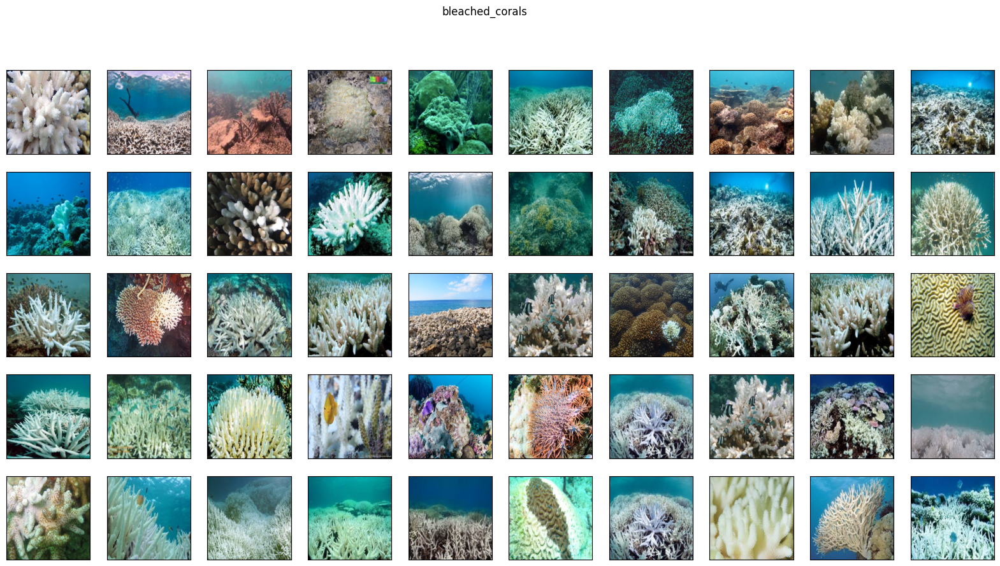

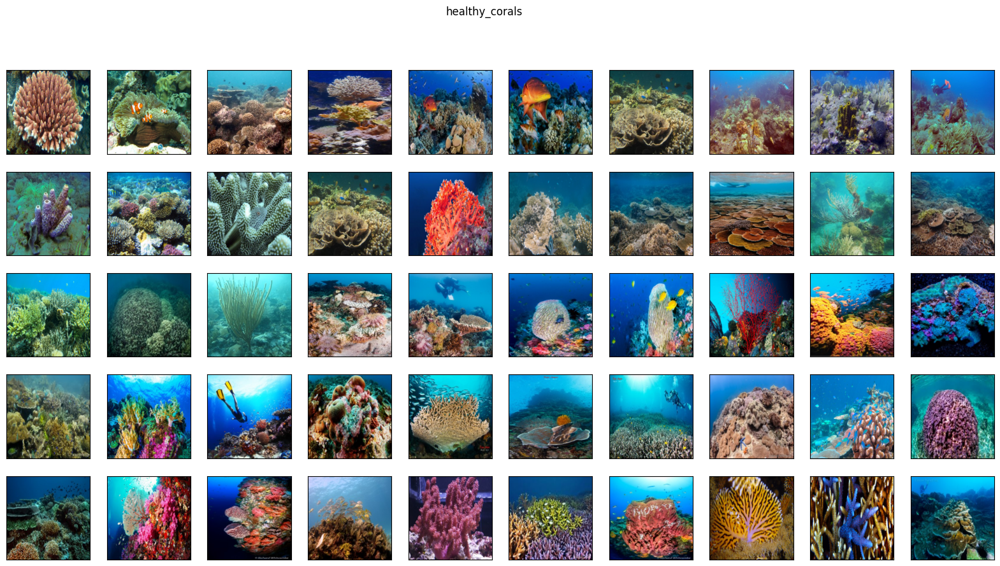

In [48]:
plot_sample_images(coral_data,label_dict_coral)

In [7]:
def segment_coral(image):
    # Read the image
    original_image = image
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (3,3), 0)
    # Use Canny edge detection
    edges = cv2.Canny(blurred, 50, 150)
    # Use morphological operations to close gaps in the edges
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    # Find contours
    contours, _ = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Create a mask for the coral
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    # Segment the coral
    segmented = cv2.bitwise_and(original_image, original_image, mask=mask)

    return segmented, mask, closed

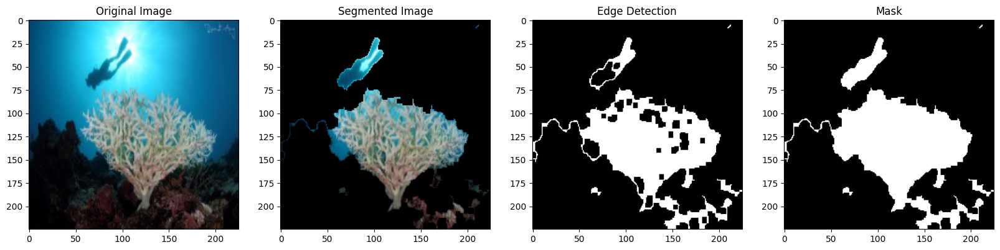

In [8]:
def plot_segmented_image(image):
    segmented_image, mask, closed = segment_coral(image)
    
    plt.figure(figsize=(20, 5))
    
    plt.subplot(1, 4, 1)
    plt.title('Original Image')
    plt.imshow(image) 
    plt.subplot(1, 4, 2)
    plt.title('Segmented Image')
    plt.imshow(segmented_image)
    plt.subplot(1, 4, 3)
    plt.title('Edge Detection')
    plt.imshow(closed, cmap='gray')
    plt.subplot(1, 4, 4)
    plt.title('Mask')
    plt.imshow(mask, cmap='gray')
    plt.show()

sample_image = coral_data['image'][300]
plot_segmented_image(sample_image)

In [52]:
segmented_images = []
for index, row in coral_data.iterrows():
    segmented_coral_image, mask = segment_coral(row['image'])
    segmented_images.append(segmented_coral_image)

# Save the enhanced images in a new dataframe
segmented_coral_image = coral_data.copy()
segmented_coral_image['image'] = segmented_images

In [53]:
from sklearn.model_selection import train_test_split
# train_set, test_set = train_test_split(coral_data,test_size=0.3,random_state=1)
train_set, test_set = train_test_split(segmented_coral_image,test_size=0.2,random_state=1)

In [26]:
print(test_set)

      Image_Id                                              image  \
900        900  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
867        867  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
1023      1023  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
1185      1185  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
952        952  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
...        ...                                                ...   
154        154  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
754        754  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
1222      1222  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
623        623  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   
188        188  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...   

                Dim  width  height  channel  Label  
900   (225, 225, 3)    225     225        3      1  
867   (225, 225, 3)    225     225        3      1  
1023  (225, 

In [83]:
print(train_set.shape)
print(test_set.shape)

(1028, 7)
(258, 7)


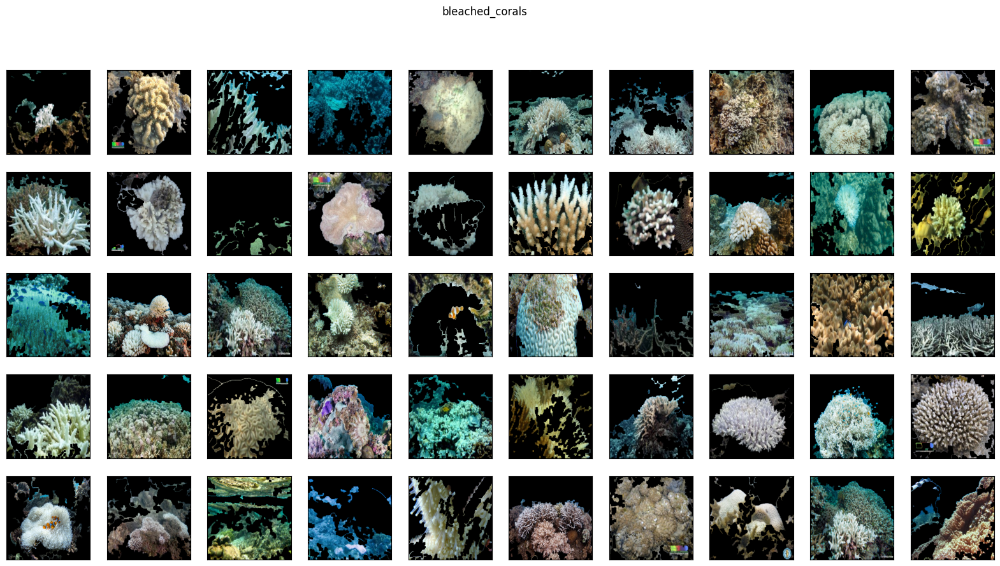

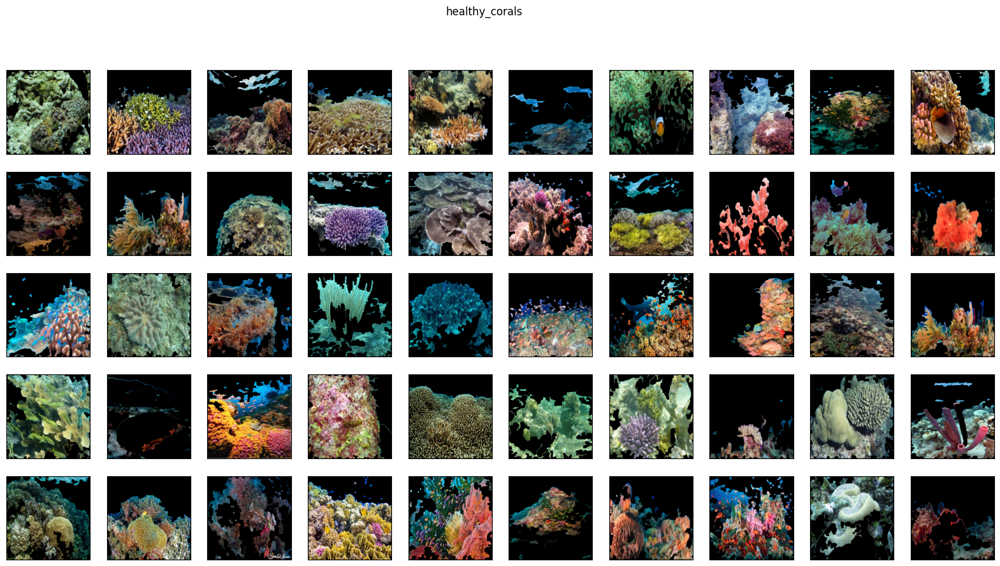

In [56]:
plot_sample_images(train_set,label_dict_coral)

In [58]:
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import albumentations

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.11 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations


In [59]:
def augment_image(image,visualise=False):
    height, width = image.shape[:2]
    augmentation_pipeline = albumentations.Compose(
        [
            albumentations.RandomRotate90(always_apply=True,p=0.5),
            albumentations.HorizontalFlip(always_apply=True,p=0.5),
            albumentations.VerticalFlip(always_apply=True, p=0.5),
            albumentations.Rotate(
                limit=360,
                border_mode=cv2.BORDER_REFLECT_101,
                p=1.0,
            ),
            albumentations.RandomResizedCrop(
                height=height, 
                width=width, 
                scale=(0.8, 1.0),  # Adjust the scale to control the crop range
                ratio=(0.75, 1.33),  # Adjust the ratio to control the aspect ratio range
                p=1.0,
            )
        ],p=1
    )
    augmented_image = augmentation_pipeline(image=image)['image']

    if visualise:
        from matplotlib import pyplot as plt
        plt.axis('off')
        plt.imshow(augmented_image,cmap='gray')
    return augmented_image

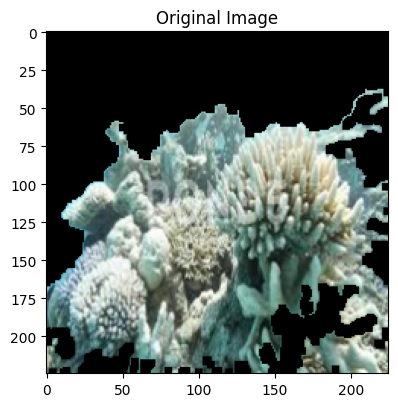

In [60]:
def plot_segmented_image(image):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(image)
    plt.show()


sample_image = train_set['image'][100]
plot_segmented_image(sample_image)

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [159 171 159]
  [193 204 190]
  [200 210 193]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [158 168 155]
  [175 186 170]
  [197 209 191]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [198 207 192]
  [206 214 198]
  [215 225 207]]

 ...

 [[ 47  67  71]
  [ 47  68  71]
  [ 46  67  69]
  ...
  [ 73 119 106]
  [ 78 123 110]
  [ 80 125 110]]

 [[ 46  66  69]
  [ 49  70  73]
  [ 49  70  71]
  ...
  [ 58 106  94]
  [ 80 130 116]
  [ 93 141 126]]

 [[ 50  69  73]
  [ 48  69  71]
  [ 50  71  73]
  ...
  [ 56 105  93]
  [ 82 134 120]
  [ 96 148 132]]]


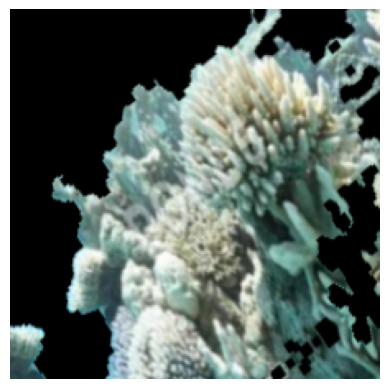

In [61]:
print(augment_image(train_set['image'][100],visualise=True))

In [62]:
def augment_dataset(df, target_count=4000):
    augmented_images = []
    augmented_labels = []

    initial_count = len(df)
    augmentations_per_image = (target_count - initial_count) // initial_count

    for i in range(initial_count):
        image = df['image'].iloc[i]
        label = df['Label'].iloc[i]
        image_array = img_to_array(image).astype('uint8')  # Convert image to numpy array

        for _ in range(max(3,augmentations_per_image)):
            augmented_image = augment_image(image_array)
            augmented_images.append(augmented_image)
            augmented_labels.append(label)

    # Create the augmented DataFrame
    augmented_df = pd.DataFrame()
    augmented_df['Image_Id'] = [i for i in range(len(augmented_images))]
    augmented_df['image'] = augmented_images
    augmented_df["Dim"] = augmented_df["image"].apply(np.shape)
    augmented_df['width'], augmented_df['height'], augmented_df['channel'] = zip(*augmented_df.Dim)
    augmented_df['Label'] = augmented_labels
    
    return augmented_df

In [63]:
augmented_coral_data = augment_dataset(train_set, target_count=3000)

In [36]:
augmented_coral_data

,Image_Id,image,Dim,width,height,channel,Label
0,0,"[[[0, 0, 0], [8, 6, 1], [40, 31, 15], [77, 65,...","(225, 225, 3)",225,225,3,0
1,1,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(225, 225, 3)",225,225,3,0
2,2,"[[[0, 0, 0], [0, 0, 0], [7, 4, 2], [35, 25, 13...","(225, 225, 3)",225,225,3,0
3,3,"[[[96, 96, 84], [82, 82, 72], [72, 72, 63], [8...","(225, 225, 3)",225,225,3,0
4,4,"[[[119, 114, 82], [121, 116, 86], [120, 118, 8...","(225, 225, 3)",225,225,3,0
...,...,...,...,...,...,...,...
3079,3079,"[[[212, 210, 194], [227, 226, 211], [239, 240,...","(225, 225, 3)",225,225,3,0
3080,3080,"[[[77, 120, 102], [96, 119, 107], [118, 125, 1...","(225, 225, 3)",225,225,3,0
3081,3081,"[[[12, 105, 93], [11, 109, 101], [8, 112, 109]...","(225, 225, 3)",225,225,3,1
3082,3082,"[[[10, 77, 43], [36, 131, 93], [31, 137, 117],...","(225, 225, 3)",225,225,3,1


In [64]:
augmented_coral_data.shape

(3084, 7)

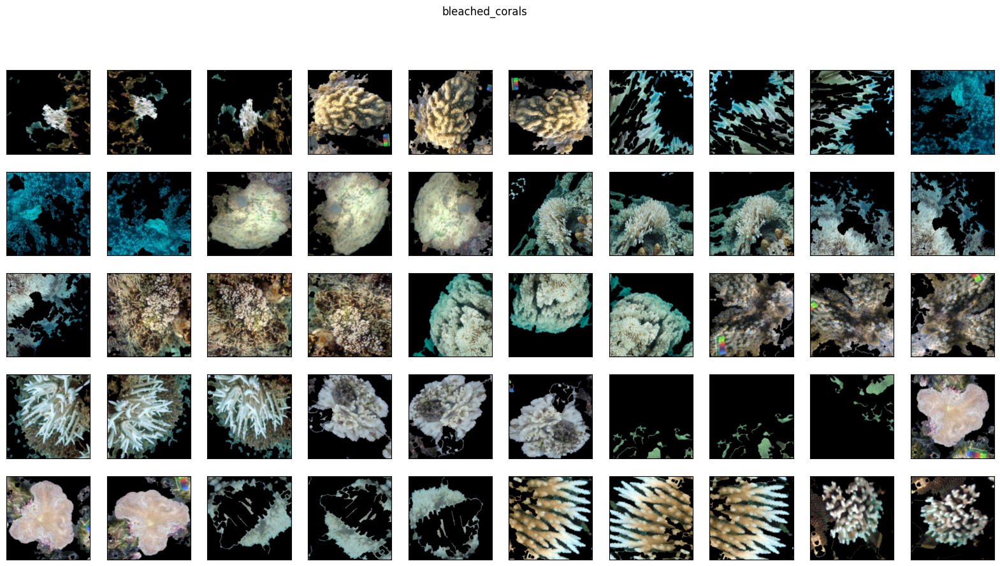

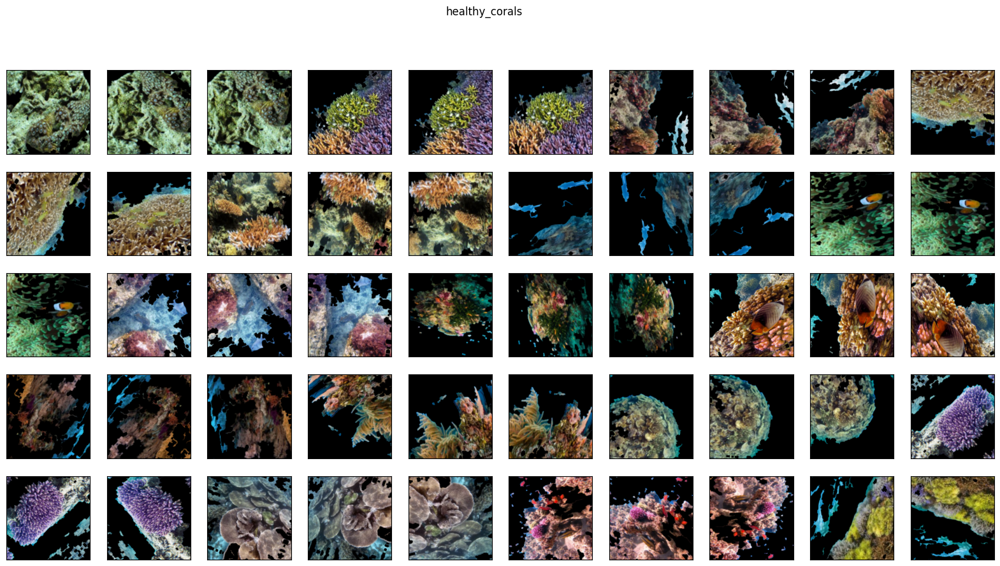

In [65]:

plot_sample_images(augmented_coral_data,label_dict_coral)

In [84]:
combined_coral_data = pd.concat([train_set, augmented_coral_data], ignore_index=True)

In [85]:
combined_coral_data.shape

(4112, 7)

Export dataset

In [86]:
def export_to_jpg(image_id: int, image, label: int, partition: str):
    partition_folder = os.path.join(os.getcwd(), "coral_image_jpg", partition)
    if not os.path.exists(partition_folder):
        os.makedirs(partition_folder)
    
    # Convert RGB to BGR format for OpenCV
    if image.shape[2] == 3:  # Check if image has 3 channels (RGB)
        image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    else:
        image_bgr = image
    
    return cv2.imwrite(os.path.join(partition_folder, f"{str(image_id)}_{str(label)}.jpg"), image_bgr)

In [87]:
if not os.path.exists(os.path.join(os.getcwd(),"coral_image_jpg_2")):
    os.mkdir("coral_image_jpg")

export_train = combined_coral_data.apply(lambda x: export_to_jpg(x.name, x.image, x.Label, 'train'), axis=1)
export_test = test_set.apply(lambda x: export_to_jpg(x.name, x.image, x.Label, 'test'), axis=1)
print("Exporting complete.")

Exporting complete.
